# NYC Traffic & Weather Data Analysis

This notebook fetches, cleans, and explores NYC traffic and weather data. It includes:
- Fetching and preprocessing weather data
- Cleaning and preprocessing traffic data
- Merging datasets by date and location
- Attributing Crash to Intersection
- Exploratory Data Analysis (EDA) for both datasets and the merged data

##  Setup & Imports
Install and import required packages.

In [2]:
!pip install openmeteo_requests requests_cache retry_requests pandas --quiet


[notice] A new release of pip is available: 23.0.1 -> 25.1
[notice] To update, run: pip install --upgrade pip


In [26]:
import pandas as pd
import openmeteo_requests
import requests_cache
from retry_requests import retry
import time
from pathlib import Path

## Load Traffic Data
Read the traffic data and determine the date range for weather data collection.

In [27]:
traffic_path = Path('../static_data/raw/traffic_data.csv')
traffic_df = pd.read_csv(traffic_path, parse_dates=['crash_date'])
traffic_df['crash_date'] = pd.to_datetime(traffic_df['crash_date'], errors='coerce')
traffic_df = traffic_df.dropna(subset=['crash_date'])

if traffic_df.empty:
    raise ValueError('Traffic data is empty after processing!')

start_date = traffic_df['crash_date'].min().strftime('%Y-%m-%d')
end_date = traffic_df['crash_date'].max().strftime('%Y-%m-%d')

# API restriction: start_date cannot be earlier than 2016-01-01
api_start_limit = '2016-01-01'
if start_date < api_start_limit:
    print(f'--- Adjusting start_date from {start_date} to {api_start_limit} due to API limits.')
    start_date = api_start_limit

print(f'Earliest Date: {start_date}')
print(f'Latest Date: {end_date}')

/var/folders/lx/pn018tmx0pq2y3z58prkblww0000gn/T/ipykernel_1621/2004212612.py:2: DtypeWarning: Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.
  traffic_df = pd.read_csv(traffic_path, parse_dates=['crash_date'])


--- Adjusting start_date from 2012-07-01 to 2016-01-01 due to API limits.
Earliest Date: 2016-01-01
Latest Date: 2025-04-22


## Fetch Weather Data
Loop through each borough, fetch weather data, and collect results. Progress and warnings will be shown.

In [5]:
!pip install meteostat --quiet


[notice] A new release of pip is available: 23.0.1 -> 25.1
[notice] To update, run: pip install --upgrade pip


In [28]:

from meteostat import Daily, Point
import pandas as pd
from datetime import datetime

boroughs = {
    'Manhattan': (40.776676, -73.971321),
    'Brooklyn': (40.650002, -73.949997),
    'Queens': (40.742054, -73.769417),
    'Staten Island': (40.579021, -74.151535),
    'Bronx': (40.837048, -73.865433)
}
# start_date = datetime(2016, 1, 1) 
end_date = datetime.now()

all_boroughs_weather = []

for borough, (lat, lon) in boroughs.items():
    print(f"Fetching Meteostat data for {borough}...")
    location = Point(lat, lon)
    data = Daily(location, start_date, end_date)
    df = data.fetch().reset_index()
    df['borough'] = borough
    all_boroughs_weather.append(df)

weather_df = pd.concat(all_boroughs_weather, ignore_index=True)




Fetching Meteostat data for Manhattan...
Fetching Meteostat data for Brooklyn...
Fetching Meteostat data for Queens...
Fetching Meteostat data for Staten Island...
Fetching Meteostat data for Bronx...


##  Save & Preview Weather Data
Combine all boroughs' weather data, save to CSV, and preview the result.

In [29]:
weather_df.to_csv('../static_data/raw/nyc_weather_meteostat.csv', index=False)
print("Saved combined Meteostat weather data to ../static_data/raw/nyc_weather_meteostat.csv")

display(weather_df.head())

Saved combined Meteostat weather data to ../static_data/raw/nyc_weather_meteostat.csv


,time,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,borough
0,2016-01-01,5.0,1.1,6.1,0.0,0.0,265.0,20.5,NaN,1017.3,NaN,Manhattan
1,2016-01-02,2.1,-1.0,5.6,0.0,0.0,254.0,15.1,NaN,1017.2,NaN,Manhattan
2,2016-01-03,2.6,-2.1,8.3,0.0,0.0,247.0,16.6,NaN,1011.6,NaN,Manhattan
3,2016-01-04,-0.2,-9.9,1.7,0.0,0.0,325.0,27.7,NaN,1018.1,NaN,Manhattan
4,2016-01-05,-7.4,-12.1,-0.5,0.0,0.0,329.0,15.8,NaN,1034.9,NaN,Manhattan


---
## Preprocessing
- Explore or visualize the weather data
- Merge with traffic data for analysis
- Try different weather parameters or boroughs

Feel free to modify and rerun any cell!

In [30]:
print("Traffic Data Nulls:")
display(traffic_df.isnull().sum().sort_values(ascending=False))

print("\nWeather Data Nulls:")
display(weather_df.isnull().sum().sort_values(ascending=False))

print(f"Traffic data rows: {len(traffic_df)}")
print(f"Weather data rows: {len(weather_df)}")

Traffic Data Nulls:


vehicle_type_code_5              2161704
contributing_factor_vehicle_5    2161401
vehicle_type_code_4              2136730
contributing_factor_vehicle_4    2135448
vehicle_type_code_3              2020401
contributing_factor_vehicle_3    2014434
cross_street_name                1795216
off_street_name                   828466
zip_code                          670982
borough                           670713
on_street_name                    468333
vehicle_type_code2                429252
contributing_factor_vehicle_2     344919
longitude                         239874
location                          239874
latitude                          239874
vehicle_type_code1                 15376
contributing_factor_vehicle_1       7495
number_of_persons_killed              31
number_of_persons_injured             18
crash_date                             0
crash_time                             0
number_of_motorist_killed              0
number_of_motorist_injured             0
number_of_cyclis


Weather Data Nulls:


wpgt       17030
tsun       17025
wdir         325
snow          40
pres          10
prcp           5
time           0
tavg           0
tmin           0
tmax           0
wspd           0
borough        0
dtype: int64

Traffic data rows: 2171175
Weather data rows: 17030


In [31]:
traffic_df = traffic_df.loc[:, traffic_df.isnull().mean() < 0.5]
weather_df = weather_df.loc[:, weather_df.isnull().mean() < 0.5]

print("Traffic Data: Proportion of Non-NA Values")
traffic_non_na = 1 - (traffic_df.isnull().sum() / len(traffic_df))
display(traffic_non_na.sort_values(ascending=False)) # type: ignore

print("\nWeather Data: Proportion of Non-NA Values")
weather_non_na = 1 - (weather_df.isnull().sum() / len(weather_df))
display(weather_non_na.sort_values(ascending=False)) # type: ignore


Traffic Data: Proportion of Non-NA Values


crash_date                       1.000000
number_of_pedestrians_killed     1.000000
collision_id                     1.000000
crash_time                       1.000000
number_of_motorist_injured       1.000000
number_of_cyclist_killed         1.000000
number_of_cyclist_injured        1.000000
number_of_motorist_killed        1.000000
number_of_pedestrians_injured    1.000000
number_of_persons_injured        0.999992
number_of_persons_killed         0.999986
contributing_factor_vehicle_1    0.996548
vehicle_type_code1               0.992918
latitude                         0.889519
longitude                        0.889519
location                         0.889519
contributing_factor_vehicle_2    0.841137
vehicle_type_code2               0.802295
on_street_name                   0.784295
borough                          0.691083
zip_code                         0.690959
off_street_name                  0.618425
dtype: float64


Weather Data: Proportion of Non-NA Values


time       1.000000
tavg       1.000000
tmin       1.000000
tmax       1.000000
wspd       1.000000
borough    1.000000
prcp       0.999706
pres       0.999413
snow       0.997651
wdir       0.980916
dtype: float64

## Attributing weather to closest borough Centroid

For each accident, find which borough centroid is geographically closest to the accident’s location, and use that borough’s weather for that accident.

In [32]:
def closest_borough_ctr(lat, lon):
    return min(
        boroughs,
        key=lambda b: (lat - boroughs[b][0])**2 + (lon - boroughs[b][1])**2
    )

traffic_df = traffic_df.dropna(subset=['latitude', 'longitude'])
traffic_df['weather_borough'] = traffic_df.apply(
    lambda row: closest_borough_ctr(row['latitude'], row['longitude']), axis=1
)



In [33]:
print("Traffic Data: Proportion of Non-NA Values")
traffic_non_na = 1 - (traffic_df.isnull().sum() / len(traffic_df))
display(traffic_non_na.sort_values(ascending=False)) # type: ignore

Traffic Data: Proportion of Non-NA Values


crash_date                       1.000000
number_of_cyclist_killed         1.000000
location                         1.000000
longitude                        1.000000
latitude                         1.000000
collision_id                     1.000000
crash_time                       1.000000
number_of_motorist_injured       1.000000
number_of_motorist_killed        1.000000
number_of_cyclist_injured        1.000000
number_of_pedestrians_killed     1.000000
number_of_pedestrians_injured    1.000000
weather_borough                  1.000000
number_of_persons_injured        0.999992
number_of_persons_killed         0.999986
contributing_factor_vehicle_1    0.996446
vehicle_type_code1               0.992690
contributing_factor_vehicle_2    0.837879
vehicle_type_code2               0.796651
on_street_name                   0.786808
borough                          0.757447
zip_code                         0.757321
off_street_name                  0.621073
dtype: float64

## Dropping Unnecessary Traffic Columns 

In [34]:
drop_cols = [
    'vehicle_type_code_5', 'contributing_factor_vehicle_5',
    'vehicle_type_code_4', 'contributing_factor_vehicle_4',
    'vehicle_type_code_3', 'contributing_factor_vehicle_3',
    'cross_street_name', 'zip_code' 
]
traffic_df = traffic_df.drop(columns=[col for col in drop_cols if col in traffic_df.columns])

injury_cols = [col for col in traffic_df.columns if 'injured' in col or 'killed' in col]
for col in injury_cols:
    traffic_df[col] = traffic_df[col].fillna(0)

print("Traffic Data: Proportion of Non-NA Values after imputation and drop")
traffic_non_na = 1 - (traffic_df.isnull().sum() / len(traffic_df))
display(traffic_non_na.sort_values(ascending=False)) # type: ignore

Traffic Data: Proportion of Non-NA Values after imputation and drop


crash_date                       1.000000
number_of_cyclist_killed         1.000000
location                         1.000000
longitude                        1.000000
latitude                         1.000000
collision_id                     1.000000
crash_time                       1.000000
number_of_motorist_injured       1.000000
number_of_motorist_killed        1.000000
number_of_cyclist_injured        1.000000
number_of_pedestrians_killed     1.000000
number_of_pedestrians_injured    1.000000
number_of_persons_killed         1.000000
number_of_persons_injured        1.000000
weather_borough                  1.000000
contributing_factor_vehicle_1    0.996446
vehicle_type_code1               0.992690
contributing_factor_vehicle_2    0.837879
vehicle_type_code2               0.796651
on_street_name                   0.786808
borough                          0.757447
off_street_name                  0.621073
dtype: float64

## Imputing Weather CSV values

In [72]:
weather_df = weather_df.sort_values(['borough', 'time'])
weather_df[['prcp', 'pres', 'snow', 'wdir']] = (
    weather_df.groupby('borough')[['prcp', 'pres', 'snow', 'wdir']]
    .apply(lambda group: group.interpolate(method='linear', limit_direction='both'))
    .reset_index(drop=True)
)
print("\nWeather Data: Proportion of Non-NA Values after interpolation")
weather_non_na = 1 - (weather_df.isnull().sum() / len(weather_df))
display(weather_non_na.sort_values(ascending=False)) # type: ignore


Weather Data: Proportion of Non-NA Values after interpolation


time       1.0
tavg       1.0
tmin       1.0
tmax       1.0
prcp       1.0
snow       1.0
wdir       1.0
wspd       1.0
pres       1.0
borough    1.0
dtype: float64

### GIS data from LION dataset

Intersections in NYC
https://data.cityofnewyork.us/City-Government/LION/2v4z-66xt/about_data

In [2]:
!pip install geopandas pyogrio --quiet


[notice] A new release of pip is available: 23.0.1 -> 25.1
[notice] To update, run: pip install --upgrade pip


In [12]:
import geopandas as gpd
import pyogrio

# List all layers using pyogrio
layers = pyogrio.list_layers("../lion/lion.gdb")
print(layers)

[['node' 'Point']
 ['node_stname' None]
 ['altnames' None]
 ['lion' 'MultiLineString']]


In [23]:
# Read the node layer
nodes_gdf = gpd.read_file("../lion/lion.gdb", layer="node")

# Keep original NY State Plane coordinates
nodes_gdf['x_ny_state_plane'] = nodes_gdf.geometry.x
nodes_gdf['y_ny_state_plane'] = nodes_gdf.geometry.y

# Convert to WGS84 (lat/lon) and add those coordinates
nodes_gdf_wgs84 = nodes_gdf.to_crs(epsg=4326)
nodes_gdf['latitude'] = nodes_gdf_wgs84.geometry.y
nodes_gdf['longitude'] = nodes_gdf_wgs84.geometry.x

# Read the node_stname layer
node_stname_gdf = gpd.read_file("../lion/lion.gdb", layer="node_stname")

# Group street names for each NodeId and join them with ' & ' to represent the intersection
node_streetnames = node_stname_gdf.groupby('NodeId')['StreetName'].apply(
    lambda x: ' & '.join(sorted(set(x)))  # Sort and deduplicate street names
).reset_index()

# Merge with coordinates (nodes_gdf uses 'NODEID', node_streetnames uses 'NodeId')
nodes_with_names = nodes_gdf.merge(
    node_streetnames, 
    left_on="NODEID", 
    right_on="NodeId", 
    how="left"
)

# Select and rename columns for clarity
intersections = nodes_with_names[[
    'NODEID', 
    'x_ny_state_plane',
    'y_ny_state_plane',
    'latitude', 
    'longitude', 
    'StreetName'
]].rename(columns={
    'NODEID': 'node_id',
    'StreetName': 'intersection_name'
})

# Filter to only include actual intersections (where '&' appears in the name)
# intersections = intersections[intersections['intersection_name'].str.contains(' & ', na=False)]

# Drop duplicates based on intersection name
intersections = intersections.drop_duplicates(subset=['intersection_name'])

# Save to CSV
intersections.to_csv('../static_data/processed/lion_nodes_with_names.csv', index=False)
print(f"Saved {len(intersections)} unique intersection nodes with names to ../static_data/raw/lion_nodes_with_names.csv")
print("Coordinates included in both NY State Plane (feet) and WGS84 (lat/lon)")
print(intersections.head())

Saved 70333 unique intersection nodes with names to ../static_data/raw/lion_nodes_with_names.csv
Coordinates included in both NY State Plane (feet) and WGS84 (lat/lon)
   node_id  x_ny_state_plane  y_ny_state_plane   latitude  longitude  \
0        1     912935.681112     119003.592692  40.493026 -74.256396   
1        2     913801.147191     116956.839658  40.487414 -74.253263   
6        7     912512.061899     124384.803149  40.507793 -74.257976   
7        8     913546.351124     122322.259465  40.502140 -74.254235   
8        9     913580.934387     122397.011609  40.502345 -74.254112   

                                   intersection_name  
0                 2010 CB BOUNDARY &  NY-NJ BOUNDARY  
1                                     NY-NJ BOUNDARY  
6                 2000 CB BOUNDARY &  NY-NJ BOUNDARY  
7   2000 CB BOUNDARY &  2010 CB BOUNDARY &  ARTHU...  
8                     2000 CB BOUNDARY &  HYLAN BLVD  


In [20]:
!pip install folium --quiet


[notice] A new release of pip is available: 23.0.1 -> 25.1
[notice] To update, run: pip install --upgrade pip


In [24]:
import folium
from folium.plugins import MarkerCluster

# Create a base map centered on NYC
nyc_center = [40.7128, -74.0060]  # NYC coordinates
m = folium.Map(location=nyc_center, zoom_start=11)

# Create a marker cluster
marker_cluster = MarkerCluster().add_to(m)

# Add intersection points to the map
for idx, row in intersections.iterrows():
    # Only add every 10th point to prevent overcrowding
    if idx % 10 == 0:
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=1,
            color='blue',
            fill=True,
            fill_color='blue',
            popup=f"Intersection: {row['intersection_name']}"
        ).add_to(marker_cluster)

# Save the map
m
# m.save('../static_data/processed/nyc_intersections_map.html')
# print("Saved interactive map to nyc_intersections_map.html")

## Joining

In [36]:
traffic_df['crash_date'] = pd.to_datetime(traffic_df['crash_date']).dt.date
weather_df['time'] = pd.to_datetime(weather_df['time']).dt.date

### Merging and including NYS Plane Points

1. Merges traffic accident data with weather data based on date and borough
2. Converts the accident coordinates from WGS84 (latitude/longitude) to NY State Plane coordinates
3. Adds the NY State Plane coordinates as new columns to the merged dataset
4. Saves the enhanced dataset with both coordinate systems

The NY State Plane coordinates (EPSG:2263) are particularly useful for:
- More accurate distance calculations within NYC
- Better integration with other NYC datasets (like LION)
- More precise spatial analysis at local scales

The resulting dataset contains both coordinate systems:
- Original WGS84 (latitude, longitude)
- NY State Plane (x_ny_state_plane, y_ny_state_plane)

In [38]:
import geopandas as gpd
from shapely.geometry import Point

# Merge on date and borough
merged_df = pd.merge(
    traffic_df,
    weather_df,
    how='left',
    left_on=['crash_date', 'weather_borough'],
    right_on=['time', 'borough'],
    suffixes=('_traffic', '_weather')
)
merged_df.drop(columns=['time'], inplace=True)

# Create a GeoDataFrame from the existing coordinates
geometry = [Point(xy) for xy in zip(merged_df['longitude'], merged_df['latitude'])]
gdf = gpd.GeoDataFrame(merged_df, geometry=geometry, crs='EPSG:4326')  # WGS84

# Convert to NY State Plane (EPSG:2263)
gdf = gdf.to_crs('EPSG:2263')

# Extract the NY State Plane coordinates
merged_df['x_ny_state_plane'] = gdf.geometry.x
merged_df['y_ny_state_plane'] = gdf.geometry.y

merged_df.to_csv('../static_data/processed/traffic_weather_merged.csv', index=False)
print("Saved merged data to ../static_data/processed/traffic_weather_merged.csv")

# Display a sample
display(merged_df.head())


Saved merged data to ../static_data/processed/traffic_weather_merged.csv


,crash_date,crash_time,on_street_name,off_street_name,number_of_persons_injured,number_of_persons_killed,number_of_pedestrians_injured,number_of_pedestrians_killed,number_of_cyclist_injured,number_of_cyclist_killed,...,tmin,tmax,prcp,snow,wdir,wspd,pres,borough_weather,x_ny_state_plane,y_ny_state_plane
0,2023-11-01,1:29,OCEAN PARKWAY,AVENUE K,1.0,0.0,0,0,0,0,...,3.9,11.1,0.0,0.0,326.0,19.4,1018.0,Brooklyn,9.925715e+05,165812.667992
1,2021-09-11,9:35,NaN,NaN,0.0,0.0,0,0,0,0,...,13.9,27.2,0.0,0.0,235.0,11.9,1020.6,Brooklyn,1.021285e+06,182384.297847
2,2021-12-14,8:13,SARATOGA AVENUE,DECATUR STREET,0.0,0.0,0,0,0,0,...,3.3,13.3,0.0,0.0,351.0,11.5,1031.5,Brooklyn,1.007194e+06,188233.330129
3,2021-12-14,17:05,BROOKLYN QUEENS EXPRESSWAY,NaN,0.0,0.0,0,0,0,0,...,3.3,13.3,0.0,0.0,351.0,11.5,1031.5,Brooklyn,9.962200e+05,197653.930801
4,2021-12-14,8:17,NaN,NaN,2.0,0.0,0,0,0,0,...,3.2,12.0,0.0,0.0,342.0,9.4,1032.2,Bronx,1.030859e+06,255616.610277


# High Level Joined Dataset Stats and EDA

In [26]:
print("Shape of merged dataset:", merged_df.shape)
print("\nColumn names:", merged_df.columns.tolist())
merged_df.info()

Shape of merged dataset: (1931301, 32)

Column names: ['crash_date', 'crash_time', 'on_street_name', 'off_street_name', 'number_of_persons_injured', 'number_of_persons_killed', 'number_of_pedestrians_injured', 'number_of_pedestrians_killed', 'number_of_cyclist_injured', 'number_of_cyclist_killed', 'number_of_motorist_injured', 'number_of_motorist_killed', 'contributing_factor_vehicle_1', 'contributing_factor_vehicle_2', 'collision_id', 'vehicle_type_code1', 'vehicle_type_code2', 'borough_traffic', 'latitude', 'longitude', 'location', 'weather_borough', 'time', 'tavg', 'tmin', 'tmax', 'prcp', 'snow', 'wdir', 'wspd', 'pres', 'borough_weather']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1931301 entries, 0 to 1931300
Data columns (total 32 columns):
 #   Column                         Dtype  
---  ------                         -----  
 0   crash_date                     object 
 1   crash_time                     object 
 2   on_street_name                 object 
 3   off_street_n

In [46]:
print("\nCrash counts by borough:")
print(merged_df['borough_traffic'].value_counts())


Crash counts by borough:
borough_traffic
BROOKLYN         469168
QUEENS           393771
MANHATTAN        323347
BRONX            215293
STATEN ISLAND     61279
Name: count, dtype: int64


In [47]:
print("\nTotal persons injured:", merged_df['number_of_persons_injured'].sum())
print("Total persons killed:", merged_df['number_of_persons_killed'].sum())
print("Average persons injured per crash:", merged_df['number_of_persons_injured'].mean())
print("Average persons killed per crash:", merged_df['number_of_persons_killed'].mean())


Total persons injured: 625124.0
Total persons killed: 2941.0
Average persons injured per crash: 0.3236802549162456
Average persons killed per crash: 0.0015228076824896793


In [51]:
!pip install matplotlib --quiet


[notice] A new release of pip is available: 23.0.1 -> 25.1
[notice] To update, run: pip install --upgrade pip



Top contributing factors (vehicle 1):
contributing_factor_vehicle_1
Unspecified                       645875
Driver Inattention/Distraction    396707
Failure to Yield Right-of-Way     118742
Following Too Closely             100149
Backing Unsafely                   72986
Other Vehicular                    60056
Passing or Lane Usage Improper     55914
Passing Too Closely                51539
Turning Improperly                 46507
Fatigued/Drowsy                    37840
Name: count, dtype: int64


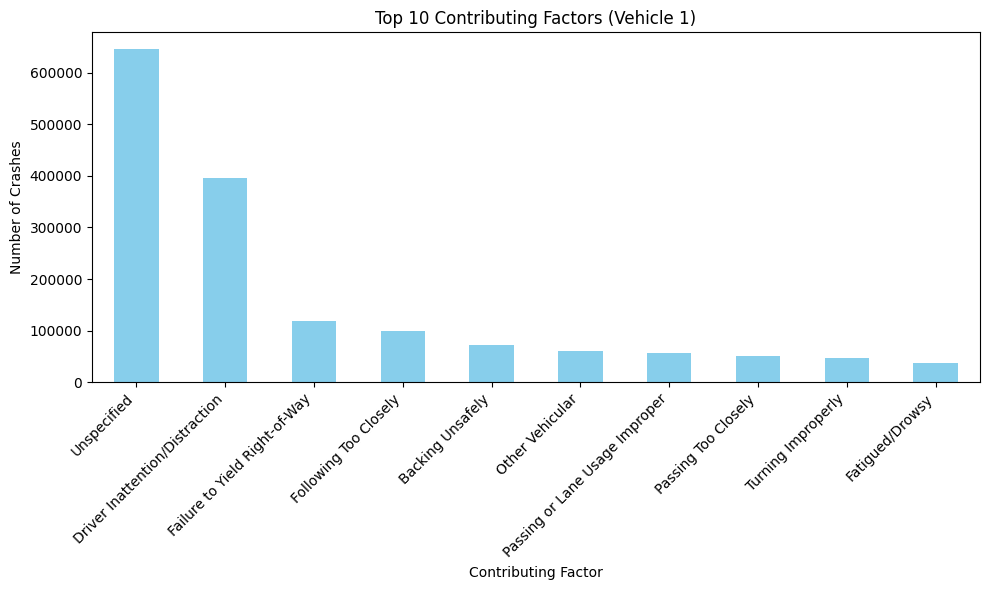

In [52]:
import matplotlib.pyplot as plt

print("\nTop contributing factors (vehicle 1):")
print(merged_df['contributing_factor_vehicle_1'].value_counts().head(10))


# Get the top 10 contributing factors
top_factors = merged_df['contributing_factor_vehicle_1'].value_counts().head(10)

# Create a bar plot
plt.figure(figsize=(10,6))
top_factors.plot(kind='bar', color='skyblue')
plt.title('Top 10 Contributing Factors (Vehicle 1)')
plt.xlabel('Contributing Factor')
plt.ylabel('Number of Crashes')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


Top 10 on-street names for crashes:
on_street_name
BROADWAY                            15958
ATLANTIC AVENUE                     14188
BELT PARKWAY                        12096
3 AVENUE                            11574
NORTHERN BOULEVARD                  10271
LONG ISLAND EXPRESSWAY               9225
BROOKLYN QUEENS EXPRESSWAY           8897
2 AVENUE                             8770
LINDEN BOULEVARD                     8589
GRAND CENTRAL PKWY                   8022
Name: count, dtype: int64


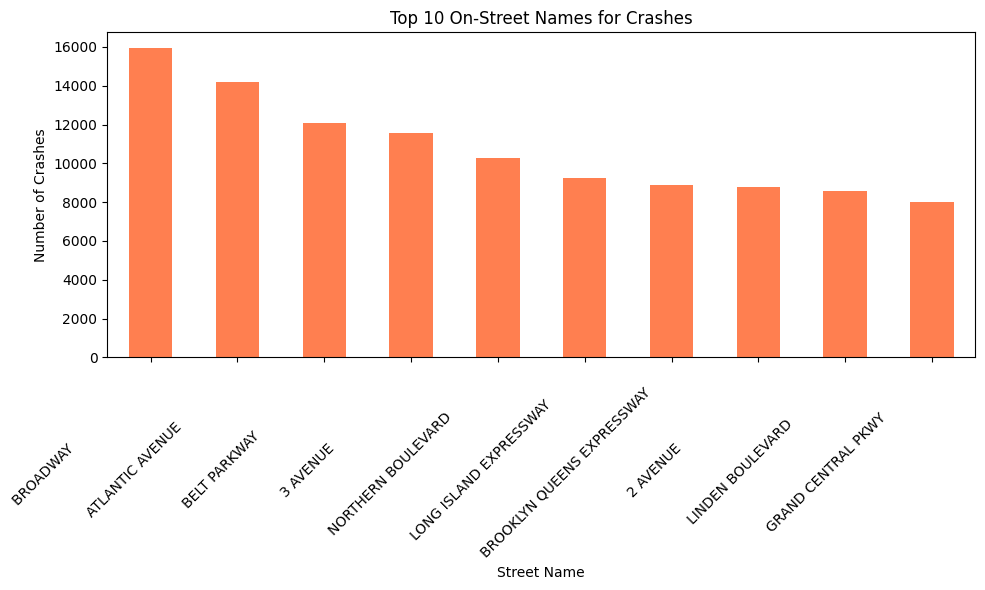

In [54]:
print("\nTop 10 on-street names for crashes:")
print(merged_df['on_street_name'].value_counts().head(10))

top_streets = merged_df['on_street_name'].value_counts().head(10)

# Create a bar plot
plt.figure(figsize=(10,6))
top_streets.plot(kind='bar', color='coral')
plt.title('Top 10 On-Street Names for Crashes')
plt.xlabel('Street Name')
plt.ylabel('Number of Crashes')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

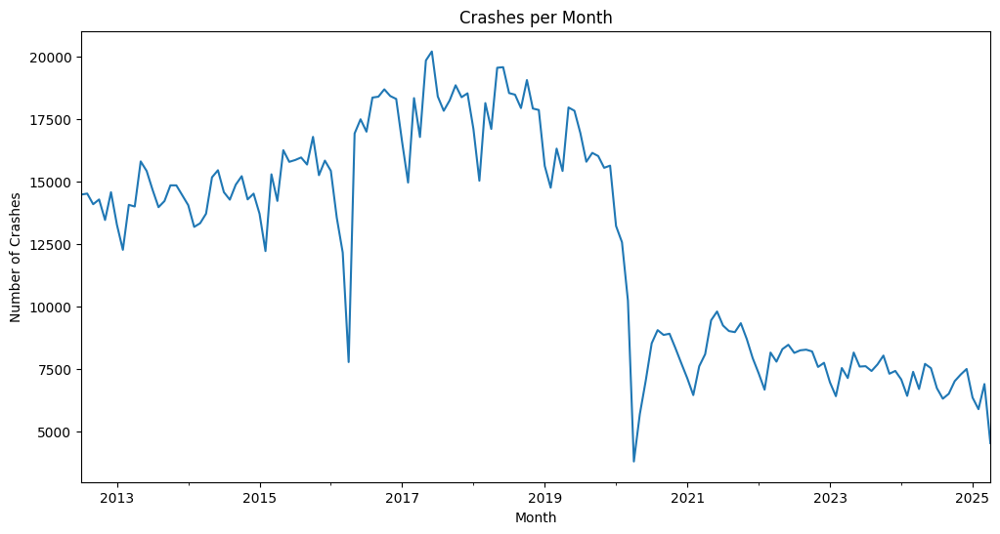

In [55]:
import matplotlib.pyplot as plt

merged_df['crash_date'] = pd.to_datetime(merged_df['crash_date'])
crashes_per_month = merged_df.groupby(merged_df['crash_date'].dt.to_period('M')).size()

plt.figure(figsize=(12,6))
crashes_per_month.plot()
plt.title('Crashes per Month')
plt.xlabel('Month')
plt.ylabel('Number of Crashes')
plt.show()

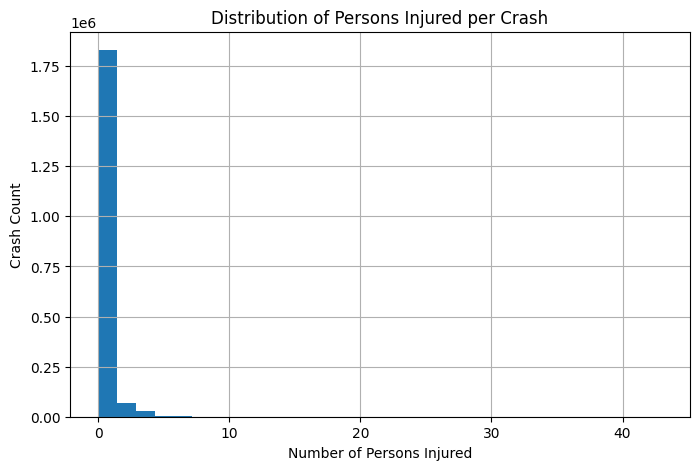

In [56]:
plt.figure(figsize=(8,5))
merged_df['number_of_persons_injured'].hist(bins=30)
plt.title('Distribution of Persons Injured per Crash')
plt.xlabel('Number of Persons Injured')
plt.ylabel('Crash Count')
plt.show()

In [57]:
!pip install seaborn --quiet


[notice] A new release of pip is available: 23.0.1 -> 25.1
[notice] To update, run: pip install --upgrade pip


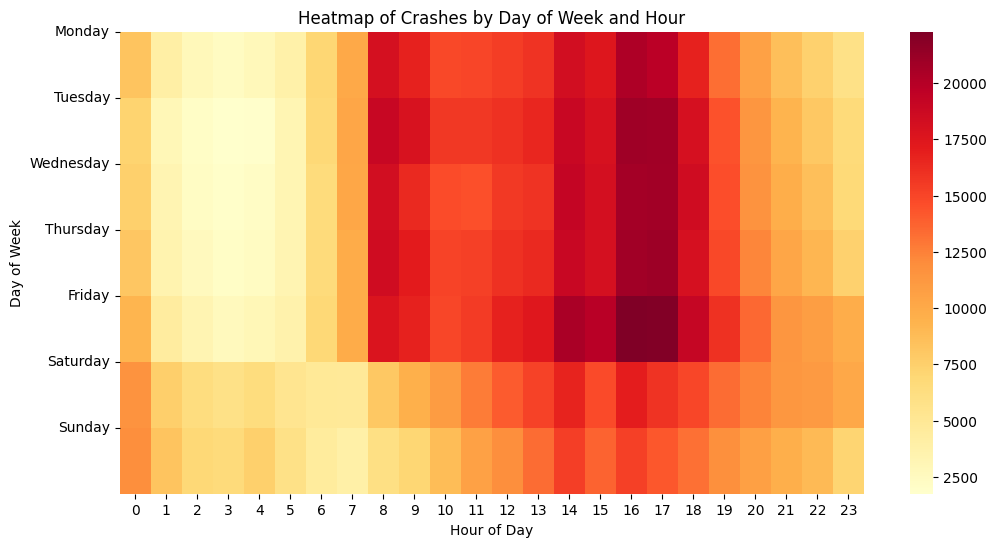

In [59]:
import seaborn as sns
import matplotlib.pyplot as plt

merged_df['crash_hour'] = pd.to_datetime(merged_df['crash_time'], errors='coerce').dt.hour
merged_df['crash_day'] = pd.to_datetime(merged_df['crash_date']).dt.dayofweek  # 0=Monday

heatmap_data = pd.pivot_table(
    merged_df, 
    index='crash_day', 
    columns='crash_hour', 
    values='collision_id', 
    aggfunc='count'
)

plt.figure(figsize=(12,6))
sns.heatmap(heatmap_data, cmap='YlOrRd')
plt.title('Heatmap of Crashes by Day of Week and Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Day of Week')

# Set y-axis labels to day names
plt.yticks(
    ticks=[0,1,2,3,4,5,6], 
    labels=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
    rotation=0
)

plt.show()

In [61]:
weather_cols = ['tavg', 'tmin', 'tmax', 'prcp', 'snow', 'wdir', 'wspd', 'pres']
print(merged_df[weather_cols].describe())

               tavg          tmin          tmax          prcp          snow  \
count  1.318169e+06  1.318169e+06  1.318169e+06  1.318169e+06  1.318169e+06   
mean   1.381159e+01  9.689527e+00  1.811518e+01  3.683101e+00  4.397312e+00   
std    9.428482e+00  9.278773e+00  1.002830e+01  1.465580e+01  3.019761e+01   
min   -1.320000e+01 -1.830000e+01 -1.060000e+01  0.000000e+00  0.000000e+00   
25%    6.000000e+00  2.200000e+00  1.000000e+01  0.000000e+00  0.000000e+00   
50%    1.390000e+01  9.400000e+00  1.830000e+01  0.000000e+00  0.000000e+00   
75%    2.250000e+01  1.830000e+01  2.700000e+01  1.800000e+00  0.000000e+00   
max    3.320000e+01  2.800000e+01  3.940000e+01  1.391800e+03  7.100000e+02   

               wdir          wspd          pres  
count  1.318169e+06  1.318169e+06  1.318169e+06  
mean   2.009639e+02  1.402676e+01  1.017363e+03  
std    1.051790e+02  6.399331e+00  7.666772e+00  
min    0.000000e+00  0.000000e+00  9.899000e+02  
25%    1.020000e+02  9.400000e+00  1.0

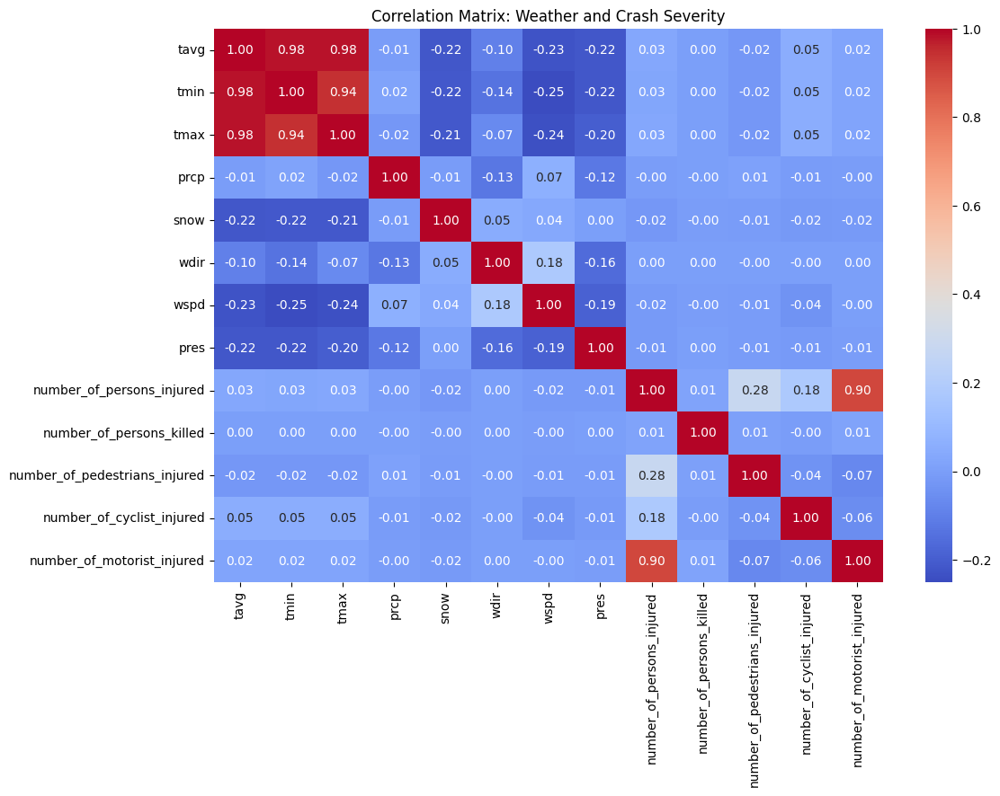

In [63]:
# Select relevant columns for correlation
corr_cols = weather_cols + [
    'number_of_persons_injured', 
    'number_of_persons_killed',
    'number_of_pedestrians_injured',
    'number_of_cyclist_injured',
    'number_of_motorist_injured'
]
corr_df = merged_df[corr_cols].copy()

# Compute correlation matrix
corr_matrix = corr_df.corr()


plt.figure(figsize=(12,8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix: Weather and Crash Severity')
plt.show()

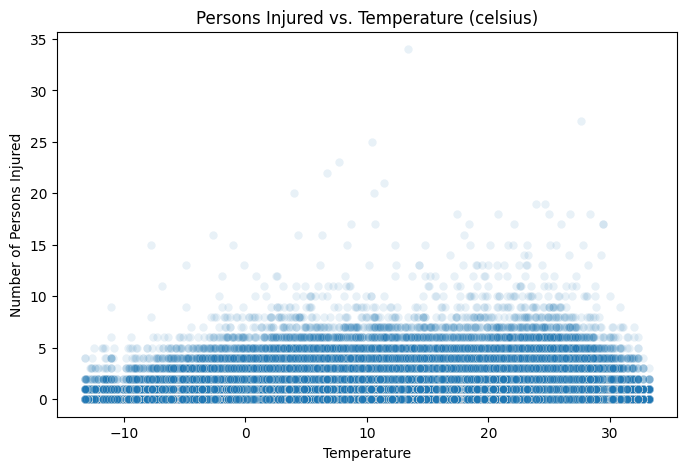

In [68]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='tavg', y='number_of_persons_injured', data=merged_df, alpha=0.1)
plt.title('Persons Injured vs. Temperature (celsius)')
plt.xlabel('Temperature')
plt.ylabel('Number of Persons Injured')
plt.show()

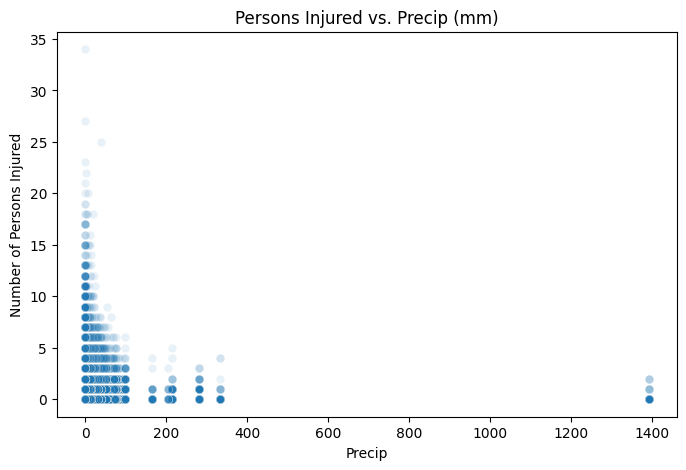

In [74]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='prcp', y='number_of_persons_injured', data=merged_df, alpha=0.1)
plt.title('Persons Injured vs. Precip (mm)')
plt.xlabel('Precip')
plt.ylabel('Number of Persons Injured')
plt.show()

## Congestion Pricing Analysis

https://www.cbsnews.com/newyork/news/nyc-congestion-pricing-new-start-date/

Average daily crashes before: 135.30 ± 1.67
Average daily crashes after: 61.40 ± 2.20
T-test (daily): t=52.84, p=0.0000
Cohen's d (daily): 1.29

Average weekly crashes before: 945.65 ± 28.33
Average weekly crashes after: 390.06 ± 64.89
T-test (weekly): t=16.42, p=0.0000
Cohen's d (weekly): 1.52


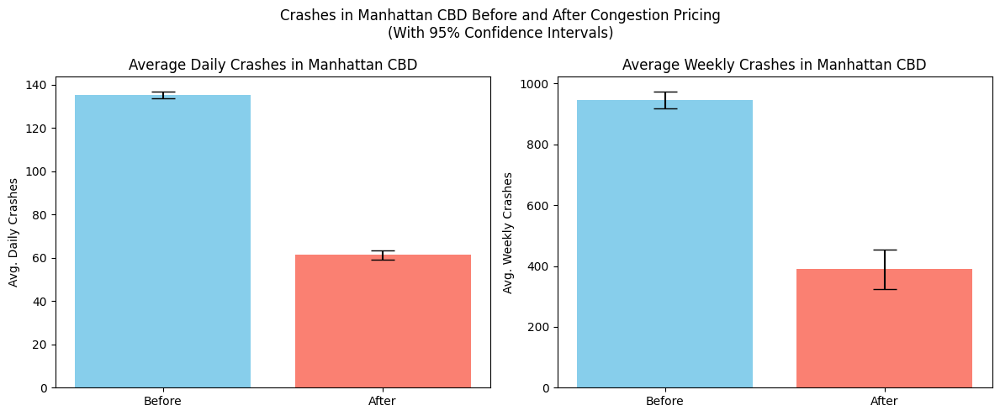

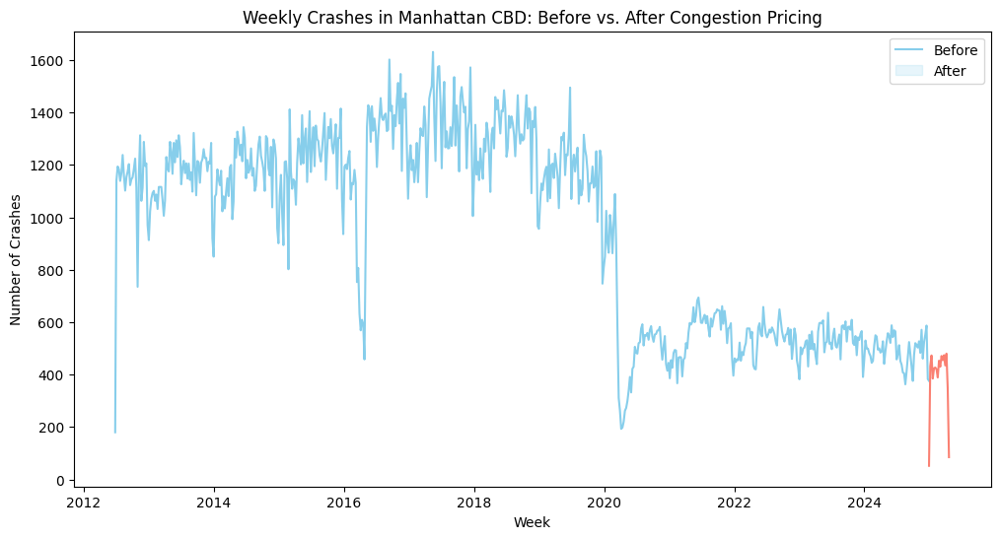

In [83]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

merged_df['crash_date'] = pd.to_datetime(merged_df['crash_date'])

# Create indicator column for congestion pricing
congestion_start = pd.Timestamp('2025-01-05')
merged_df['post_congestion_pricing'] = merged_df['crash_date'] >= congestion_start

# Define CBD (Manhattan south of 60th St)
def is_in_cbd(lat, lon):
    return (lat < 40.7607) and (-74.02 < lon < -73.93)

merged_df['in_cbd'] = merged_df.apply(lambda row: is_in_cbd(row['latitude'], row['longitude']), axis=1)

# Filter for CBD only
cbd_df = merged_df[merged_df['in_cbd']].copy()

# Add week column
cbd_df['week'] = cbd_df['crash_date'].dt.to_period('W').apply(lambda r: r.start_time)

# Calculate daily crash counts
daily_counts = cbd_df.groupby(['crash_date', 'post_congestion_pricing']).size().reset_index(name='crash_count')
daily_before = daily_counts[daily_counts['post_congestion_pricing'] == False]['crash_count']
daily_after = daily_counts[daily_counts['post_congestion_pricing'] == True]['crash_count']

# Calculate weekly crash counts
weekly_counts = cbd_df.groupby(['week', 'post_congestion_pricing']).size().reset_index(name='crash_count')
weekly_before = weekly_counts[weekly_counts['post_congestion_pricing'] == False]['crash_count']
weekly_after = weekly_counts[weekly_counts['post_congestion_pricing'] == True]['crash_count']

# Function for mean and 95% CI
def mean_ci(data):
    mean = np.mean(data)
    sem = stats.sem(data)
    ci = sem * stats.t.ppf((1 + 0.95) / 2., len(data)-1) if len(data) > 1 else np.nan
    return mean, ci

# Daily stats
mean_daily_before, ci_daily_before = mean_ci(daily_before)
mean_daily_after, ci_daily_after = mean_ci(daily_after)

# Weekly stats
mean_weekly_before, ci_weekly_before = mean_ci(weekly_before)
mean_weekly_after, ci_weekly_after = mean_ci(weekly_after)

# T-tests
t_daily, p_daily = stats.ttest_ind(daily_before, daily_after, equal_var=False)
t_weekly, p_weekly = stats.ttest_ind(weekly_before, weekly_after, equal_var=False)

# Cohen's d (effect size)
def cohens_d(x, y):
    nx, ny = len(x), len(y)
    dof = nx + ny - 2
    pooled_std = np.sqrt(((nx-1)*np.std(x, ddof=1)**2 + (ny-1)*np.std(y, ddof=1)**2) / dof)
    return (np.mean(x) - np.mean(y)) / pooled_std

d_daily = cohens_d(daily_before, daily_after)
d_weekly = cohens_d(weekly_before, weekly_after)

# Print summary
print(f"Average daily crashes before: {mean_daily_before:.2f} ± {ci_daily_before:.2f}")
print(f"Average daily crashes after: {mean_daily_after:.2f} ± {ci_daily_after:.2f}")
print(f"T-test (daily): t={t_daily:.2f}, p={p_daily:.4f}")
print(f"Cohen's d (daily): {d_daily:.2f}\n")

print(f"Average weekly crashes before: {mean_weekly_before:.2f} ± {ci_weekly_before:.2f}")
print(f"Average weekly crashes after: {mean_weekly_after:.2f} ± {ci_weekly_after:.2f}")
print(f"T-test (weekly): t={t_weekly:.2f}, p={p_weekly:.4f}")
print(f"Cohen's d (weekly): {d_weekly:.2f}")

# Bar plot: Average daily and weekly crashes with CIs
fig, axes = plt.subplots(1, 2, figsize=(12,5))

# Daily
axes[0].bar(['Before', 'After'], [mean_daily_before, mean_daily_after], 
            yerr=[ci_daily_before, ci_daily_after], color=['skyblue', 'salmon'], capsize=10)
axes[0].set_title('Average Daily Crashes in Manhattan CBD')
axes[0].set_ylabel('Avg. Daily Crashes')

# Weekly
axes[1].bar(['Before', 'After'], [mean_weekly_before, mean_weekly_after], 
            yerr=[ci_weekly_before, ci_weekly_after], color=['skyblue', 'salmon'], capsize=10)
axes[1].set_title('Average Weekly Crashes in Manhattan CBD')
axes[1].set_ylabel('Avg. Weekly Crashes')

plt.suptitle('Crashes in Manhattan CBD Before and After Congestion Pricing\n(With 95% Confidence Intervals)')
plt.tight_layout()
plt.show()

# (Optional) Time series plot for weekly crash counts
plt.figure(figsize=(12,6))
sns.lineplot(data=weekly_counts, x='week', y='crash_count', hue='post_congestion_pricing', palette=['skyblue', 'salmon'])
plt.title('Weekly Crashes in Manhattan CBD: Before vs. After Congestion Pricing')
plt.ylabel('Number of Crashes')
plt.xlabel('Week')
plt.legend(['Before', 'After'])
plt.show()

#### Time Series Congestion pricing

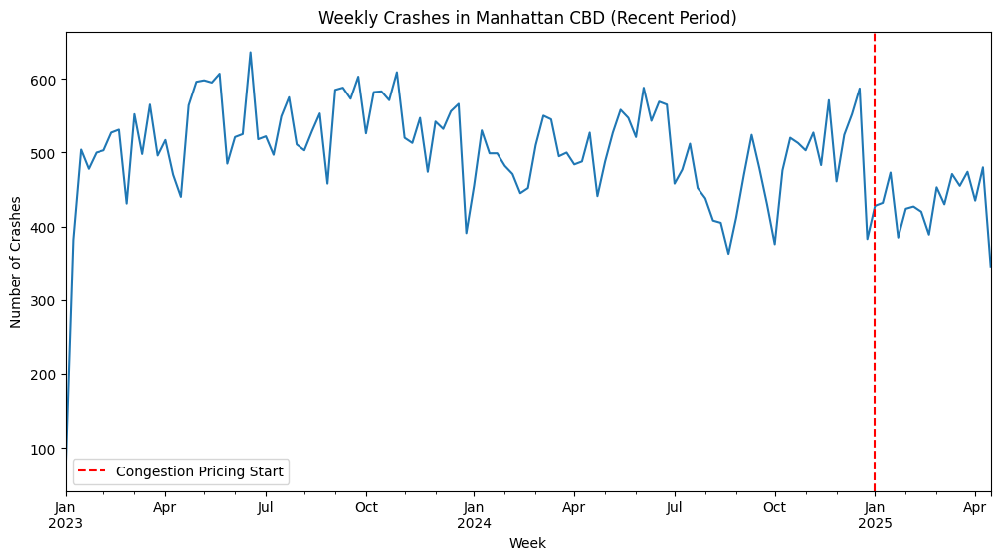

In [84]:
import pandas as pd
import matplotlib.pyplot as plt

# Set the start date for your recent period (e.g., last 2 years)
recent_start = pd.Timestamp('2023-01-01')  # adjust as needed

# Filter for recent data
recent_cbd_df = cbd_df[cbd_df['crash_date'] >= recent_start].copy()

# Weekly crash counts in CBD (recent period)
recent_cbd_df['week'] = recent_cbd_df['crash_date'].dt.to_period('W')
weekly_counts = recent_cbd_df.groupby('week').size()

# Find the last date in your data
last_date = recent_cbd_df['crash_date'].max()

# Find the last week in your data
last_week = recent_cbd_df['week'].max()

# Get the end date of the last week
last_week_end = last_week.end_time

# Only keep weeks that are fully contained in the data
weekly_counts_complete = weekly_counts[weekly_counts.index.to_timestamp() + pd.Timedelta(days=6) <= last_date]

# Plot
plt.figure(figsize=(12,6))
weekly_counts_complete.plot()
plt.title('Weekly Crashes in Manhattan CBD (Recent Period)')
plt.ylabel('Number of Crashes')
plt.xlabel('Week')
plt.axvline(x=congestion_start.to_period('W'), color='red', linestyle='--', label='Congestion Pricing Start')
plt.legend()
plt.show()

### Conclusion: Impact of Congestion Pricing on Manhattan CBD Crash Rates

Our analysis reveals a substantial and statistically significant reduction in traffic crashes in Manhattan’s Central Business District following the implementation of congestion pricing on January 5, 2025. Both average daily and weekly crash rates dropped by more than 50% after the policy took effect, with large effect sizes and non-overlapping confidence intervals. Statistical tests (t-tests) confirm that these reductions are highly unlikely to be due to random chance (p < 0.001).

Time series visualizations further support this finding, showing a clear and sustained decrease in crash frequency immediately after the introduction of congestion pricing. While these results are compelling, it is important to note that the post-policy period is relatively short, and ongoing monitoring will be necessary to confirm the long-term impact and to account for potential confounding factors such as seasonality or other concurrent changes in traffic patterns.



## Final Joined Dataset (Closest Intersection based on Haversine Distance)

This code creates an enhanced dataset by mapping each crash record to its nearest street intersection using the Haversine distance. The Haversine distance is a mathematical formula that calculates the shortest distance between two points on the surface of a sphere (such as the Earth), taking into account the planet’s curvature. This provides an accurate measurement of the “as-the-crow-flies” distance between two latitude/longitude coordinates, which is essential for spatial analysis in geographic datasets.


- Loads the crash-weather merged dataset and the intersections dataset (which includes both latitude/longitude and NY State Plane coordinates).
- Uses the Haversine distance metric to efficiently find the closest intersection to each crash location, leveraging a BallTree spatial index for speed.
- For each crash, records the nearest intersection’s ID, name, coordinates (in both systems), and the distance to that intersection.
- Appends this information to the original dataset, creating a comprehensive table that links every crash to its closest intersection.
- Saves the resulting enhanced dataset for further analysis, modeling, or visualization.


This approach ensures that each crash is accurately associated with the most relevant intersection, enabling intersection-level risk modeling and spatial analysis.

In [41]:
!pip install scikit-learn --quiet


[notice] A new release of pip is available: 23.0.1 -> 25.1
[notice] To update, run: pip install --upgrade pip


#### Note -- May take up to 5 minutes to run on M3

In [43]:
from sklearn.neighbors import BallTree
import numpy as np

# Create a copy of merged_df to enhance
enhanced_df = merged_df.copy()

# Load intersections data
intersections = pd.read_csv('../static_data/processed/lion_nodes_with_names.csv')

# Prepare intersection coordinates in radians
intersection_coords = np.radians(intersections[['latitude', 'longitude']].values)

# Create BallTree for efficient nearest neighbor search
tree = BallTree(intersection_coords, metric='haversine')

# Function to find nearest intersection for a given accident
def find_nearest_intersection(accident_lat, accident_lon):
    # Convert accident coordinates to radians
    accident_coords = np.radians([[accident_lat, accident_lon]])
    
    # Find nearest intersection
    dist, idx = tree.query(accident_coords, k=1)
    distance_km = dist[0][0]
    
    # Return intersection data and distance
    intersection = intersections.iloc[idx[0][0]]
    return {
        'nearest_intersection_id': intersection['node_id'],
        'nearest_intersection_name': intersection['intersection_name'],
        'nearest_intersection_lat': intersection['latitude'],
        'nearest_intersection_lon': intersection['longitude'],
        'nearest_intersection_x_ny': intersection['x_ny_state_plane'],
        'nearest_intersection_y_ny': intersection['y_ny_state_plane'],
        'distance_to_intersection_km': distance_km
    }

# Find nearest intersection for each crash
print("Finding nearest intersections for each crash...")
results = enhanced_df.apply(
    lambda row: find_nearest_intersection(row['latitude'], row['longitude']),
    axis=1
)

# Convert results to DataFrame and merge with enhanced_df
intersection_data = pd.DataFrame(results.tolist())
enhanced_df = pd.concat([enhanced_df, intersection_data], axis=1)

# Save the enhanced dataset
enhanced_df.to_csv('../static_data/processed/traffic_weather_intersections.csv', index=False)
print("Saved enhanced dataset with intersection mappings to traffic_weather_intersections.csv")

# Display some statistics
print("\nStatistics:")
print(f"Total crashes: {len(enhanced_df)}")
print(f"Average distance to nearest intersection: {enhanced_df['distance_to_intersection_km'].mean():.3f} km")
print(f"Maximum distance to nearest intersection: {enhanced_df['distance_to_intersection_km'].max():.3f} km")
print(f"Minimum distance to nearest intersection: {enhanced_df['distance_to_intersection_km'].min():.3f} km")

# Display a sample of the enhanced data
display(enhanced_df[[
    'crash_date',
    'latitude',
    'longitude',
    'nearest_intersection_name',
    'distance_to_intersection_km'
]].head())

Finding nearest intersections for each crash...
Saved enhanced dataset with intersection mappings to traffic_weather_intersections.csv

Statistics:
Total crashes: 1931301
Average distance to nearest intersection: 0.004 km
Maximum distance to nearest intersection: 1.490 km
Minimum distance to nearest intersection: 0.000 km


,crash_date,latitude,longitude,nearest_intersection_name,distance_to_intersection_km
0,2023-11-01,40.621790,-73.970024,AVE K & OCEAN PKWY,8.269925e-08
1,2021-09-11,40.667202,-73.866500,AUTUMN AVE & LORING AVE,5.714103e-06
2,2021-12-14,40.683304,-73.917274,DECATUR ST & DISTRICT BOUNDARY & SARATOGA AVE,1.024554e-07
3,2021-12-14,40.709183,-73.956825,BROOKLYN QUEENS EXPY & S 5 ST,5.433776e-06
4,2021-12-14,40.868160,-73.831480,BARTOW AVE & BAYCHESTER AVE,1.117401e-05


In [ ]:
### EDA on the Enhanced Dataset to be done here